In [3]:
import sys
sys.version

'3.8.18 (default, Sep 11 2023, 13:39:12) [MSC v.1916 64 bit (AMD64)]'

In [2]:
!pip install redner

     ---------------------------------------- 0.0/15.9 MB ? eta -:--:--
     ---------------------------------------- 0.0/15.9 MB ? eta -:--:--
     --------------------------------------- 0.0/15.9 MB 435.7 kB/s eta 0:00:37
     --------------------------------------- 0.0/15.9 MB 435.7 kB/s eta 0:00:37
     --------------------------------------- 0.0/15.9 MB 151.3 kB/s eta 0:01:46
     --------------------------------------- 0.1/15.9 MB 291.5 kB/s eta 0:00:55
     --------------------------------------- 0.1/15.9 MB 344.8 kB/s eta 0:00:46
     --------------------------------------- 0.1/15.9 MB 277.4 kB/s eta 0:00:58
     --------------------------------------- 0.2/15.9 MB 393.0 kB/s eta 0:00:41
      -------------------------------------- 0.3/15.9 MB 476.3 kB/s eta 0:00:33
      -------------------------------------- 0.3/15.9 MB 486.7 kB/s eta 0:00:33
      -------------------------------------- 0.4/15.9 MB 546.3 kB/s eta 0:00:29
     - ------------------------------------- 0.5/15.9 MB

In [4]:
!pip install torch

     ---------------------------------------- 0.0/5.7 MB ? eta -:--:--
     ---------------------------------------- 0.0/5.7 MB ? eta -:--:--
     ---------------------------------------- 0.0/5.7 MB ? eta -:--:--
     ---------------------------------------- 0.0/5.7 MB 330.3 kB/s eta 0:00:18
     ---------------------------------------- 0.0/5.7 MB 245.8 kB/s eta 0:00:24
     ---------------------------------------- 0.1/5.7 MB 273.8 kB/s eta 0:00:21
     ---------------------------------------- 0.1/5.7 MB 262.6 kB/s eta 0:00:22
      --------------------------------------- 0.1/5.7 MB 364.4 kB/s eta 0:00:16
      --------------------------------------- 0.1/5.7 MB 405.9 kB/s eta 0:00:14
     - -------------------------------------- 0.2/5.7 MB 420.1 kB/s eta 0:00:14
     - -------------------------------------- 0.2/5.7 MB 474.7 kB/s eta 0:00:12
     - -------------------------------------- 0.3/5.7 MB 532.5 kB/s eta 0:00:11
     -- ------------------------------------- 0.4/5.7 MB 636.5 kB/s

In [5]:
!pip install h5py

   ---------------------------------------- 0.0/2.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/2.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/2.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/2.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/2.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/2.7 MB 131.3 kB/s eta 0:00:21
   ---------------------------------------- 0.0/2.7 MB 131.3 kB/s eta 0:00:21
    --------------------------------------- 0.0/2.7 MB 122.9 kB/s eta 0:00:22
    --------------------------------------- 0.1/2.7 MB 173.0 kB/s eta 0:00:16
   - -------------------------------------- 0.1/2.7 MB 209.0 kB/s eta 0:00:13
   - -------------------------------------- 0.1/2.7 MB 243.2 kB/s eta 0:00:11
   -- ------------------------------------- 0.1/2.7 MB 284.4 kB/s eta 0:00:10
   -- ------------------------------------- 0.2/2.7 MB 318.1 kB/s eta 0:00:09
   --- ------------------------

In [7]:
!pip install matplotlib

     ---------------------------------------- 0.0/160.4 kB ? eta -:--:--
     -- ------------------------------------- 10.2/160.4 kB ? eta -:--:--
     -- ------------------------------------- 10.2/160.4 kB ? eta -:--:--
     -- ------------------------------------- 10.2/160.4 kB ? eta -:--:--
     ------- ----------------------------- 30.7/160.4 kB 163.8 kB/s eta 0:00:01
     --------- --------------------------- 41.0/160.4 kB 151.3 kB/s eta 0:00:01
     -------------- ---------------------- 61.4/160.4 kB 193.2 kB/s eta 0:00:01
     --------------------- --------------- 92.2/160.4 kB 249.8 kB/s eta 0:00:01
     ------------------------- ---------- 112.6/160.4 kB 285.2 kB/s eta 0:00:01
     -------------------------------- --- 143.4/160.4 kB 316.2 kB/s eta 0:00:01
     ------------------------------------ 160.4/160.4 kB 320.8 kB/s eta 0:00:00
   ---------------------------------------- 0.0/7.5 MB ? eta -:--:--
   ---------------------------------------- 0.1/7.5 MB 2.6 MB/s eta 0:00:03


In [8]:
import torch
import pyredner
import h5py
import urllib
import time
import numpy as np

from matplotlib.pyplot import imshow
%matplotlib inline
import os
os.environ['QT_QPA_PLATFORM']='offscreen'
import matplotlib.pyplot as plt
from IPython.display import display, clear_output
from matplotlib import animation

from IPython.display import HTML

In [9]:
with h5py.File(r'./model2017-1_bfm_nomouth.h5', 'r') as hf:
    shape_mean = torch.tensor(np.array(hf['shape/model/mean']), device = pyredner.get_device())
    shape_basis = torch.tensor(np.array(hf['shape/model/pcaBasis']), device = pyredner.get_device())
    triangle_list = torch.tensor(np.array(hf['shape/representer/cells']), device = pyredner.get_device())
    color_mean = torch.tensor(np.array(hf['color/model/mean']), device = pyredner.get_device())
    color_basis = torch.tensor(np.array(hf['color/model/pcaBasis']), device = pyredner.get_device())

In [10]:
indices = triangle_list.permute(1, 0).contiguous()

def model(
        cam_pos, 
        cam_look_at, 
        shape_coeffs, 
        color_coeffs, 
        ambient_color, 
        dir_light_intensity):
    vertices = (shape_mean + shape_basis @ shape_coeffs).view(-1, 3)
    normals = pyredner.compute_vertex_normal(vertices, indices)
    colors = (color_mean + color_basis @ color_coeffs).view(-1, 3)
    m = pyredner.Material(use_vertex_color = True)
    obj = pyredner.Object(vertices = vertices, 
                          indices = indices, 
                          normals = normals, 
                          material = m, 
                          colors = colors)
    cam = pyredner.Camera(position = cam_pos,
                          # Center of the vertices                          
                          look_at = cam_look_at,
                          up = torch.tensor([0.0, 1.0, 0.0], device = pyredner.get_device()),
                          fov = torch.tensor([45.0], device = pyredner.get_device()),
                          resolution = (256, 256))
    scene = pyredner.Scene(camera = cam, objects = [obj])
    ambient_light = pyredner.AmbientLight(ambient_color)
    dir_light = pyredner.DirectionalLight(torch.tensor([0.0, 0.0, -1.0], device = pyredner.get_device()), 
                                          dir_light_intensity)
    img = pyredner.render_deferred(scene = scene, 
                                   lights = [ambient_light, dir_light])
    return img

Scene construction, time: 0.12321 s
Forward pass, time: 0.07600 s


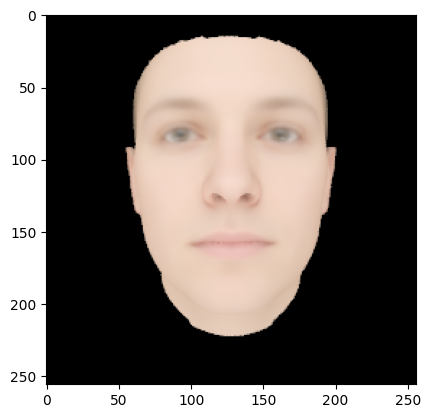

In [11]:
cam_pos = torch.tensor([-0.2697, -5.7891, 373.9277], device = pyredner.get_device())
cam_look_at = torch.tensor([-0.2697, -5.7891, 54.7918], device = pyredner.get_device())
img = model(cam_pos, 
            cam_look_at, 
            torch.zeros(199, device = pyredner.get_device()),
            torch.zeros(199, device = pyredner.get_device()),
            torch.ones(3, device = pyredner.get_device()), 
            torch.zeros(3, device = pyredner.get_device()))

imshow(torch.pow(img, 1.0/2.2).cpu())

In [14]:
!pip install opencv-python

   ---------------------------------------- 0.0/38.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/38.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/38.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/38.1 MB 217.9 kB/s eta 0:02:55
   ---------------------------------------- 0.0/38.1 MB 217.9 kB/s eta 0:02:55
   ---------------------------------------- 0.0/38.1 MB 178.6 kB/s eta 0:03:33
   ---------------------------------------- 0.1/38.1 MB 218.8 kB/s eta 0:02:54
   ---------------------------------------- 0.1/38.1 MB 295.4 kB/s eta 0:02:09
   ---------------------------------------- 0.1/38.1 MB 342.3 kB/s eta 0:01:51
   ---------------------------------------- 0.2/38.1 MB 353.1 kB/s eta 0:01:48
   ---------------------------------------- 0.2/38.1 MB 384.3 kB/s eta 0:01:39
   ---------------------------------------- 0.2/38.1 MB 450.6 kB/s eta 0:01:24
   ---------------------------------------- 0.3/38.1 MB 542.9 kB/s eta 0:01:10


True

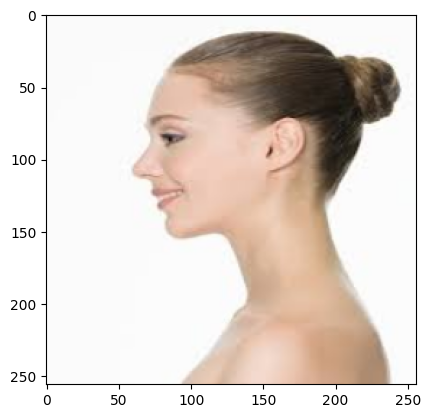

In [16]:
import cv2 as cv
img = cv.cvtColor(cv.imread("./fem_face.jpg"),cv.COLOR_BGR2RGB)

img = cv.resize(img, (256,256))
imshow(img)
cv.imwrite("target.png", img)

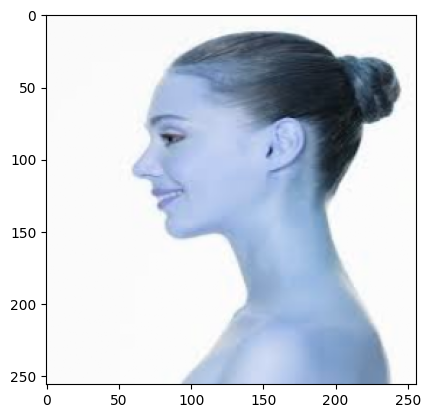

In [19]:
target = pyredner.imread('target.png').to(pyredner.get_device())

imshow(torch.pow(target, 1.0/2.2).cpu())

In [17]:
cam_pos = torch.tensor([-0.2697, -5.7891, 373.9277], 
                       requires_grad=True)
cam_look_at = torch.tensor([-0.2697, -5.7891, 54.7918], 
                           requires_grad=True)
shape_coeffs = torch.zeros(199, device = pyredner.get_device(), 
                           requires_grad=True)
color_coeffs = torch.zeros(199, device = pyredner.get_device(), 
                           requires_grad=True)
ambient_color = torch.ones(3, device = pyredner.get_device(), 
                           requires_grad=True)
dir_light_intensity = torch.zeros(3, device = pyredner.get_device(), 
                                  requires_grad=True)

# Use two different optimizers for different learning rates
optimizer = torch.optim.Adam(
                             [
                              shape_coeffs, 
                              color_coeffs, 
                              ambient_color, 
                              dir_light_intensity], 
                             lr=0.1)
cam_optimizer = torch.optim.Adam([cam_pos, cam_look_at], lr=0.5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


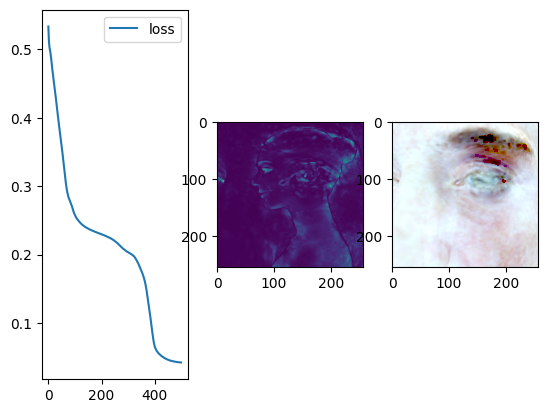

In [20]:
plt.figure()
imgs, losses = [], []

# Run 500 Adam iterations
num_iters = 500
for t in range(num_iters):
    optimizer.zero_grad()
    cam_optimizer.zero_grad()
    img = model(cam_pos, cam_look_at, shape_coeffs, 
                color_coeffs, ambient_color, dir_light_intensity)
    # Compute the loss function. Here it is L2 plus a regularization 
    # term to avoid coefficients to be too far from zero.
    # Both img and target are in linear color space, 
    # so no gamma correction is needed.

    loss = (img - target).pow(2).mean()
    loss = loss + 0.0001 * shape_coeffs.pow(2).mean() + 0.001 * color_coeffs.pow(2).mean()
    loss.backward()

    optimizer.step()
    cam_optimizer.step()

    ambient_color.data.clamp_(0.0)
    dir_light_intensity.data.clamp_(0.0)

    # Plot the loss
    f, (ax_loss, ax_diff_img, ax_img) = plt.subplots(1, 3)
    losses.append(loss.data.item())

    # Only store images every 10th iterations
    if t % 10 == 0:
        # Record the Gamma corrected image
        imgs.append(torch.pow(img.data, 1.0/2.2).cpu()) 
    clear_output(wait=True)
    ax_loss.plot(range(len(losses)), losses, label='loss')
    ax_loss.legend()
    ax_diff_img.imshow((img -target).pow(2).sum(dim=2).data.cpu())
    ax_img.imshow(torch.pow(img.data.cpu(), 1.0/2.2))
    plt.show()

C:\Users\kleychenko\AppData\Local\anaconda3\envs\myenv\lib\site-packages\matplotlib\cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


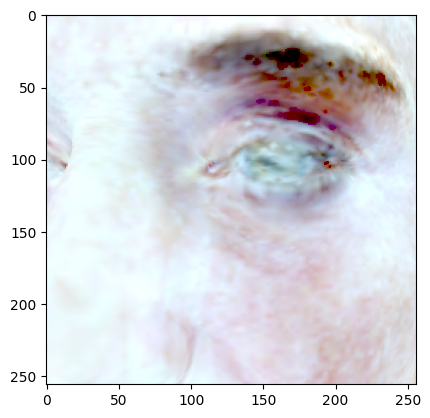

In [21]:
fig = plt.figure()

# Clamp to avoid complains
im = plt.imshow(imgs[0].clamp(0.0, 1.0), animated=True)

def update_fig(i):
    im.set_array(imgs[i].clamp(0.0, 1.0))
    return im,
anim = animation.FuncAnimation(fig, update_fig, 
                               frames=len(imgs), interval=50, blit=True)
HTML(anim.to_jshtml())